## Assignment 1 - Task 2 & 3

**Name:** Swaroop Gopala  
**Student ID:** 24216541  
**Web API Used:** United States Geological Survey (USGS) Earthquake API


## Import libraries
Importing necessary libraries for data analysis and visualization

* **Pandas** is crucial for handling datasets, allowing us to easily manipulate and analyze data frames.
* **Matplotlib** and **Seaborn** provide powerful plotting capabilities that enable us to visualize data insights effectively.
* **Folium** is particularly useful when we want to visualize geographic data on interactive maps, making it easier to interpret spatial relationships.


In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

## Load the Dataset
Loading the data extracted from the USGS Earthquake API into a DataFrame.

We use the `pd.read_csv()` function to read the dataset from a CSV file named "earthquake.csv". This function loads the data into a DataFrame, which is a two-dimensional, size-mutable, potentially heterogeneous tabular data structure with labeled axes (rows and columns).

The `df.head()` method displays the first five rows of the DataFrame. This is crucial for a few reasons:
     - It provides a quick view of the data structure and the first few records.
     - It allows us to check if the dataset loaded correctly, including confirming the presence of expected columns and the general data types.
     - We can start identifying any potential issues, such as missing values or incorrect data formats.

In [19]:
df = pd.read_csv("earthquake.csv")
df.head()

,Unnamed: 0,type,id,properties.mag,properties.place,properties.time,properties.updated,properties.tz,properties.url,properties.detail,...,properties.types,properties.nst,properties.dmin,properties.rms,properties.gap,properties.magType,properties.type,properties.title,geometry.type,geometry.coordinates
0,0,Feature,ci40960232,1.70,"20 km NW of Grapevine, CA",1729603276320,1729603414302,NaN,https://earthquake.usgs.gov/earthquakes/eventp...,https://earthquake.usgs.gov/fdsnws/event/1/que...,...,",nearby-cities,origin,phase-data,scitech-link,",30.0,0.01655,0.23,53.0,ml,earthquake,"M 1.7 - 20 km NW of Grapevine, CA",Point,"[-119.0868301, 35.0750008, 11.86]"
1,1,Feature,us7000nmea,4.90,"56 km SSE of Kawalu, Indonesia",1729601032670,1729602134040,NaN,https://earthquake.usgs.gov/earthquakes/eventp...,https://earthquake.usgs.gov/fdsnws/event/1/que...,...,",origin,phase-data,",63.0,0.82300,0.79,28.0,mb,earthquake,"M 4.9 - 56 km SSE of Kawalu, Indonesia",Point,"[108.3777, -7.861, 89.798]"
2,2,Feature,tx2024utyd,2.40,"57 km S of Whites City, New Mexico",1729600174601,1729602536040,NaN,https://earthquake.usgs.gov/earthquakes/eventp...,https://earthquake.usgs.gov/fdsnws/event/1/que...,...,",origin,phase-data,",18.0,0.10000,0.40,70.0,ml,earthquake,"M 2.4 - 57 km S of Whites City, New Mexico",Point,"[-104.366, 31.659, 4.1011]"
3,3,Feature,us7000nme7,5.00,"113 km S of Lorengau, Papua New Guinea",1729598913285,1729600156040,NaN,https://earthquake.usgs.gov/earthquakes/eventp...,https://earthquake.usgs.gov/fdsnws/event/1/que...,...,",origin,phase-data,",57.0,4.85500,0.61,49.0,mb,earthquake,"M 5.0 - 113 km S of Lorengau, Papua New Guinea",Point,"[147.4333, -3.048, 10]"
4,4,Feature,nc75077306,1.47,"3 km E of San Ramon, CA",1729596542080,1729599136696,NaN,https://earthquake.usgs.gov/earthquakes/eventp...,https://earthquake.usgs.gov/fdsnws/event/1/que...,...,",nearby-cities,origin,phase-data,scitech-link,",10.0,0.13040,0.02,140.0,md,earthquake,"M 1.5 - 3 km E of San Ramon, CA",Point,"[-121.943832397461, 37.7849998474121, 10.14999..."


## Data types
Examine the data types of each variable in the DataFrame.

This helps us identify any variables that may need to be converted to a different data type for accurate analysis.

Explanation of data types
We can see that 'properties.time' and 'properties.updated' should be of datetime type but are currently integers.
We will convert these columns to datetime data type for proper handling of date and time information.

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8422 entries, 0 to 8421
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   properties.mag        8422 non-null   float64       
 1   properties.place      8422 non-null   object        
 2   properties.time       8422 non-null   datetime64[ns]
 3   properties.updated    8422 non-null   datetime64[ns]
 4   properties.url        8422 non-null   object        
 5   properties.detail     8422 non-null   object        
 6   properties.felt       8422 non-null   float64       
 7   properties.cdi        8422 non-null   float64       
 8   properties.mmi        8422 non-null   float64       
 9   properties.status     8422 non-null   object        
 10  properties.tsunami    8422 non-null   int64         
 11  properties.sig        8422 non-null   int64         
 12  properties.net        8422 non-null   object        
 13  properties.code   

## Numeric to DateTime

Convert numeric columns representing timestamps into a datetime format.

This conversion is essential for accurately handling time-related data in our analysis.



In [21]:
df['properties.time'] = pd.to_datetime(df['properties.time'], unit='ms')
df['properties.updated'] = pd.to_datetime(df['properties.updated'], unit='ms')

## Missing values
Check for missing values in the DataFrame.

Using isna().sum() to find the count of missing values in each variable.

In [22]:
df.isna().sum()

Unnamed: 0                 0
type                       0
id                         0
properties.mag             0
properties.place           0
properties.time            0
properties.updated         0
properties.tz           8422
properties.url             0
properties.detail          0
properties.felt         7901
properties.cdi          7901
properties.mmi          8312
properties.alert        8380
properties.status          0
properties.tsunami         0
properties.sig             0
properties.net             0
properties.code            0
properties.ids             0
properties.sources         0
properties.types           0
properties.nst          1376
properties.dmin         1377
properties.rms             0
properties.gap          1376
properties.magType         0
properties.type            0
properties.title           0
geometry.type              0
geometry.coordinates       0
dtype: int64

## Dropping columns

Dropping the columns with high missing count and also few irrelevant columns like Unnamed:0 , type, id, properties.tz,  properties.alert

It is often necessary to remove columns that are either irrelevant to the analysis or contain excessive missing values. 

In [23]:
df.drop(['Unnamed: 0','type','id','properties.tz','properties.alert'],axis = 1,inplace = True)

## Descriptive Statistics

Descriptive statistics provide a summary of the central tendency, dispersion, and shape of a dataset’s distribution, excluding NaN values.

This analysis is crucial as it offers insights into the data's characteristics, which can help identify patterns, trends, and anomalies. Understanding these aspects of the data is essential before proceeding to more complex analyses or modeling.

The `df.describe()` function computes several important statistics for each numeric column. Which helps us assess whether the data is normally distributed or if it has outliers that may require special attention.

In [24]:
df.describe()

,properties.mag,properties.time,properties.updated,properties.felt,properties.cdi,properties.mmi,properties.tsunami,properties.sig,properties.nst,properties.dmin,properties.rms,properties.gap
count,8422.000000,8422,8422,521.000000,521.000000,110.000000,8422.000000,8422.000000,7046.000000,7045.000000,8422.000000,7046.000000
mean,1.455774,2024-10-06 23:05:53.851952128,2024-10-08 09:02:01.662647296,46.834933,2.574472,3.093255,0.000950,56.435407,24.478144,0.361930,0.258516,113.941730
min,-1.690000,2024-09-22 13:28:49.362000,2024-09-22 13:30:56.703000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000
25%,0.740000,2024-09-29 14:05:33.855249920,2024-10-01 09:06:39.987499776,1.000000,2.000000,2.441750,0.000000,8.000000,9.000000,0.019360,0.100000,66.000000
50%,1.290000,2024-10-07 00:25:57.550000128,2024-10-08 18:59:50.895499776,2.000000,2.200000,3.163500,0.000000,26.000000,19.000000,0.052000,0.150000,95.000000
75%,1.900000,2024-10-14 06:25:28.401999872,2024-10-15 21:05:19.351750144,6.000000,3.400000,4.016000,0.000000,56.000000,32.000000,0.114600,0.300000,148.000000
max,6.600000,2024-10-22 13:21:16.320000,2024-10-22 13:23:34.302000,6389.000000,8.400000,7.832000,1.000000,945.000000,240.000000,29.773000,2.740000,348.730000
std,1.234983,NaN,NaN,364.008896,1.365826,1.457859,0.030808,90.894954,21.515855,1.384265,0.271921,65.608562


## Filling missing values

Handling missing values is a very critical step in data pre-processing. Missing data can lead to biased results, inaccuracies, and loss of statistical power in analyses.

Filling missing values with a measure of central tendency (like the median for numeric data and mode for categorical data) allows us to retain the data while ensuring that the missing information does not adversely affect our analysis.

In [27]:
df['properties.felt'].fillna(df['properties.felt'].median(), inplace=True)  
df['properties.nst'].fillna(df['properties.nst'].median(), inplace=True)  
df['properties.mmi'].fillna(df['properties.mmi'].median(), inplace=True)
df['properties.cdi'].fillna(df['properties.cdi'].median(), inplace=True)  
df['properties.dmin'].fillna(df['properties.dmin'].median(), inplace=True)  
df['properties.gap'].fillna(df['properties.gap'].median(), inplace=True)

C:\Users\admin\AppData\Local\Temp\ipykernel_24688\103217170.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['properties.felt'].fillna(df['properties.felt'].median(), inplace=True)
C:\Users\admin\AppData\Local\Temp\ipykernel_24688\103217170.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always beh

## Data Visualisation

Data Visualisation allows us to see distribution and patterns within a dataset.

Histograms are useful for exploring the distribution of frequency of numeric data and can even identify trends, outliers, and aspects of the shape.

Looking at the charts below, it can easily be seen that all distributions except one are right-skewed. This means most of the values lie towards the lower end, while some outliers exist on the higher end of the spectrum.

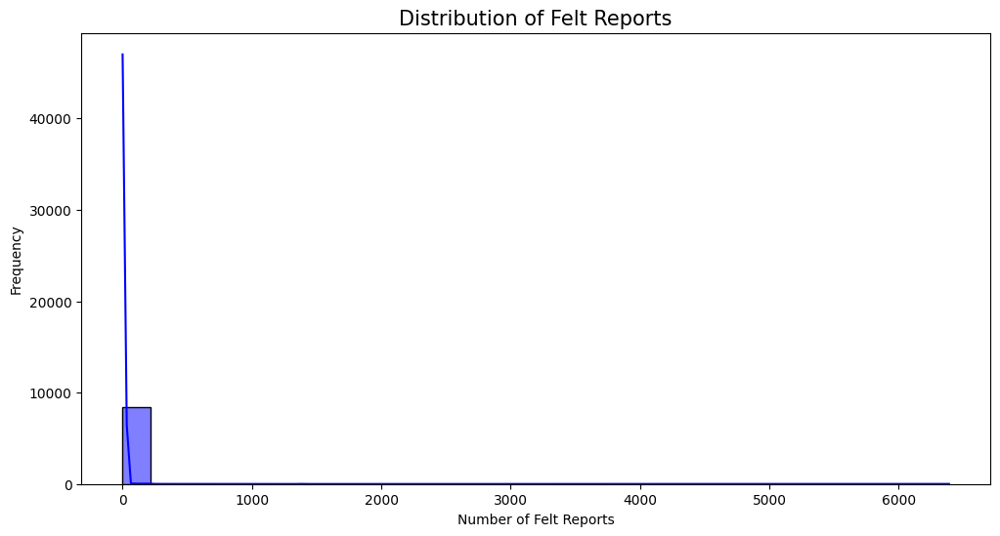

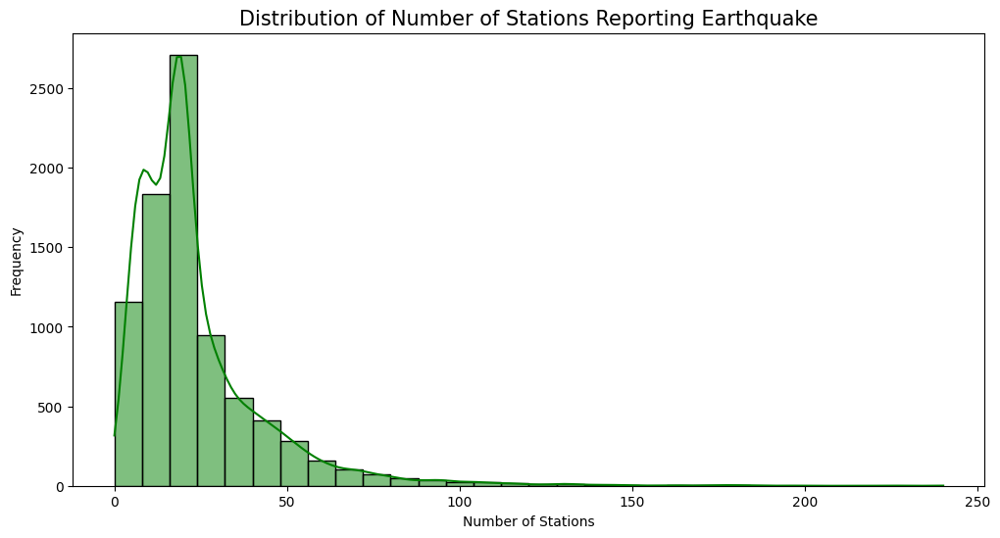

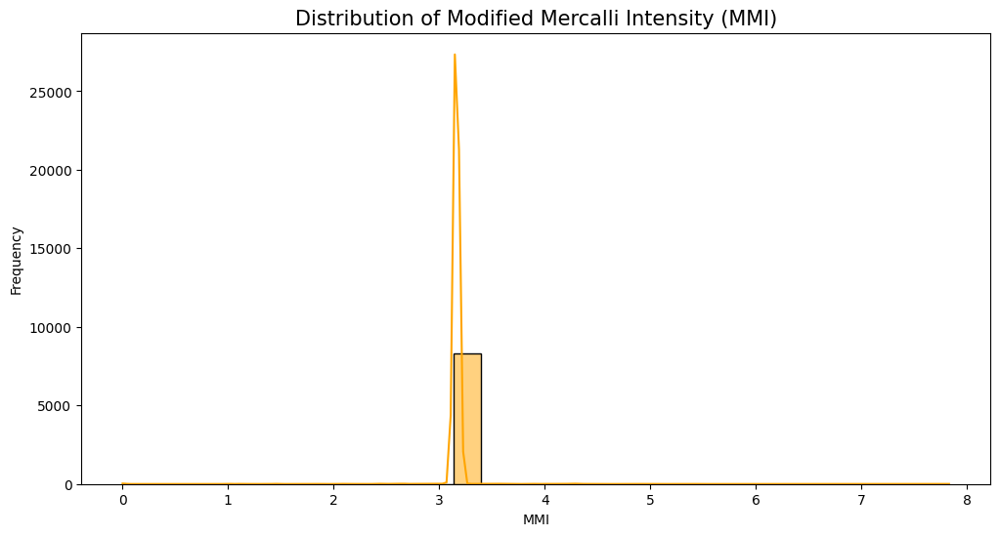

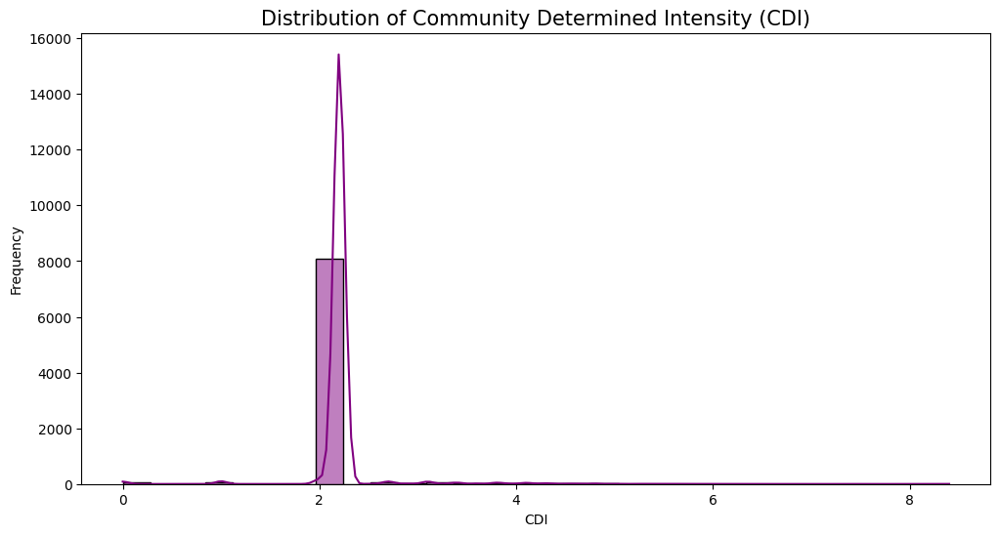

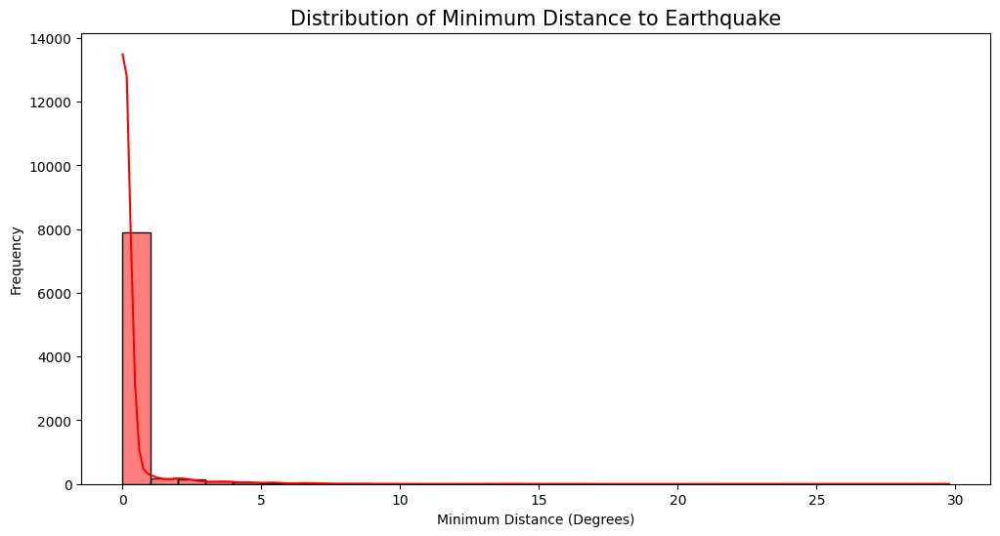

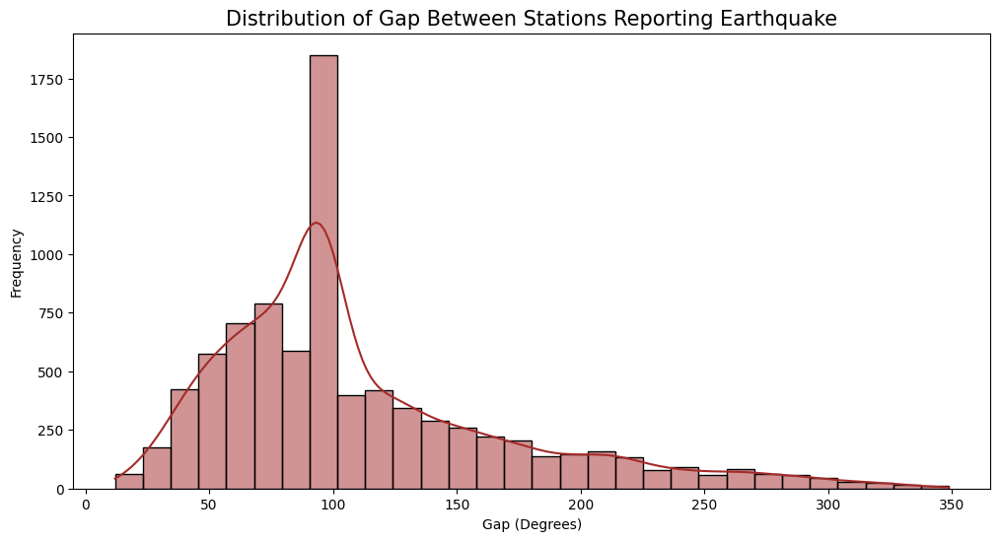

In [29]:
def create_histogram(data, column, title, xlabel, color):
    plt.figure(figsize=(12, 6))
    sns.histplot(data[column], bins=30, kde=True, color=color)
    plt.title(title, fontsize=15)
    plt.xlabel(xlabel)
    plt.ylabel('Frequency')
    plt.show()

# Felt Reports
create_histogram(df, 'properties.felt', 'Distribution of Felt Reports', 'Number of Felt Reports', 'blue')

# Number of Stations Reporting Earthquake
create_histogram(df, 'properties.nst', 'Distribution of Number of Stations Reporting Earthquake', 'Number of Stations', 'green')

# Modified Mercalli Intensity (MMI)
create_histogram(df, 'properties.mmi', 'Distribution of Modified Mercalli Intensity (MMI)', 'MMI', 'orange')

# Community Determined Intensity (CDI)
create_histogram(df, 'properties.cdi', 'Distribution of Community Determined Intensity (CDI)', 'CDI', 'purple')

# Minimum Distance to Earthquake (Dmin)
create_histogram(df, 'properties.dmin', 'Distribution of Minimum Distance to Earthquake', 'Minimum Distance (Degrees)', 'red')

# Gap Between Stations Reporting Earthquake (Gap)
create_histogram(df, 'properties.gap', 'Distribution of Gap Between Stations Reporting Earthquake', 'Gap (Degrees)', 'brown')

### Boxplot

A box plot is an effective visualisation tool for the distribution of numerical data across categories; you can see your median and some spread within the dataset up to the points where you may see outliers.

The visual below will help us understand how dispersed each variable is, as well as provide insight into the data's central tendency and variability.

The `sns.boxplot()` function also creates the box plot as it plots the values for each property given `properties.felt`, `properties.nst`, `properties.mmi`, `properties.cdi`, `properties.dmin`, `properties.gap` against their respective labels.

Each box represents an interquartile range. A line within the box is the median. The "whiskers" stretch out to the extent of the data, and points outside that range would be considered outliers.

From the boxplots it is very visible to notice the spread of each variable. Also, an indication of presence of outliers can be learned from points outside the whiskers. It's also the area where extreme values may influence data analysis.


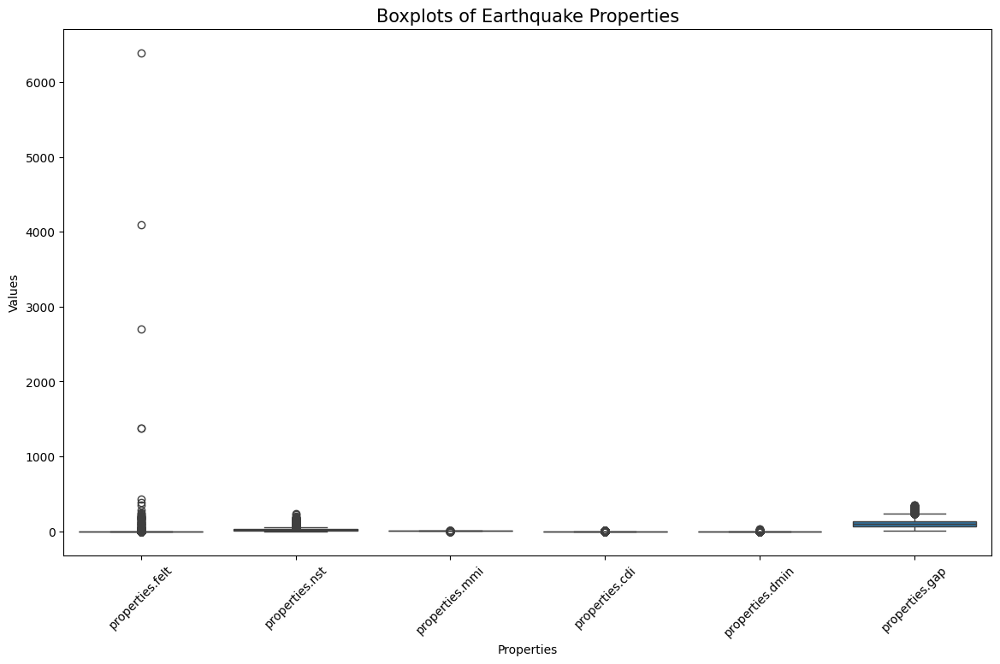

In [30]:
plt.figure(figsize=(14, 8))
df_melted = pd.melt(df[['properties.felt', 'properties.nst', 'properties.mmi', 'properties.cdi', 'properties.dmin', 'properties.gap']])
sns.boxplot(x='variable', y='value', data=df_melted)
plt.title('Boxplots of Earthquake Properties', fontsize=15)
plt.xlabel('Properties')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.show()


### Scatterplot

Scatterplots are ideal for analysing the relationship between two continuous variables. In this case, we analyse the relationship between earthquake magnitude ( `properties.mag` ) and the number of felt reports ( `properties.felt` ).

The scatterplot plots the most earthquakes at magnitudes below 4, but relatively few of these have any felt reports. From magnitudes increasing to around 4 to 5, the number of felt reports rocket significantly for some events.

The earthquakes associated with tsunamis appear in a different colour and are relatively rare, but they appear to be associated with a higher number of felt reports. This suggests that earthquakes with magnitudes greater than 5.0, particularly those associated with tsunamis, were felt over a larger area.

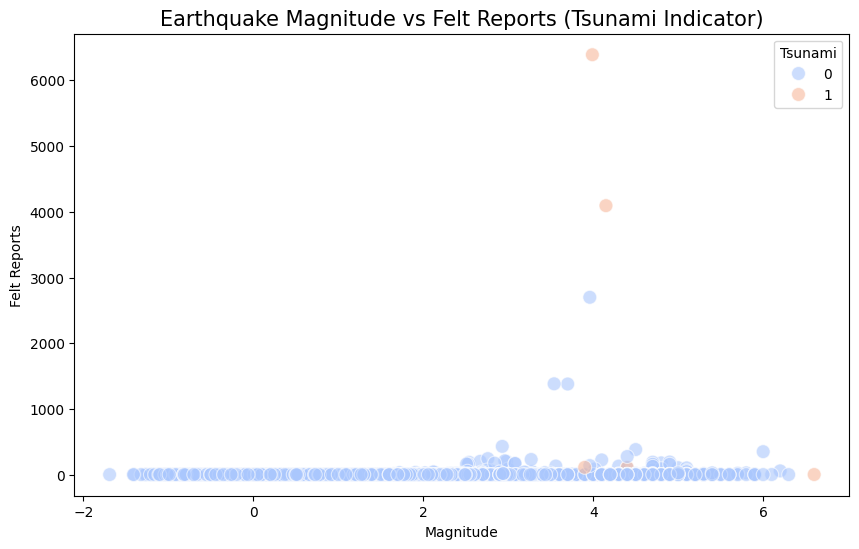

In [31]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='properties.mag', y='properties.felt', data=df, hue='properties.tsunami', palette='coolwarm', s=100, alpha=0.6)
plt.title('Earthquake Magnitude vs Felt Reports (Tsunami Indicator)', fontsize=15)
plt.xlabel('Magnitude')
plt.ylabel('Felt Reports')
plt.legend(title='Tsunami', loc='upper right')
plt.show()

### Time based visualisation

Time series plots are used to analyse data points collected or recorded over a specific time interval. Here, we will examine the time trend of various earthquake-related metrics. Using this analysis, we will be able to identify trends, seasonality, and anomalies in earthquake activity and impacts.

We will create a new column called `date` using the date that we are receiving from column `properties.time`, so we can group our data by date now.

This creates a further DataFrame, `daily_avg` based on a groupby operation of the original DataFrame by `date`. It contains a mean calculation of several important key metrics. This gives us a daily average for the magnitude and number of reports concerning what was felt and the MMI.

The visualisation shows a few time series plots showing daily averages for a variety of earthquake-related variables over time. The top left chart shows the average magnitude by day, which varies somewhat but is normally between 1.25 and 1.75, with one peak around October 9. The upper right chart, which shows the average felt reports by day, includes a few spikes - not especially around those dates - but the overall number is relatively low. Middle left, The number of stations reporting remains fairly stable at about 25, with occasional spikes. Middle right, The adjusted Mercalli intensity is fairly consistent at 3.16. Bottom Left, Community determined intensity parallels the magnitude profile with a strong spike around October 9. Bottom Right Daily average minimum distance to the earthquake is generally very low except it spikes a little early October before dropping off again. These metrics have been proved to correlate seismic activity with the impact felt, or as reported.

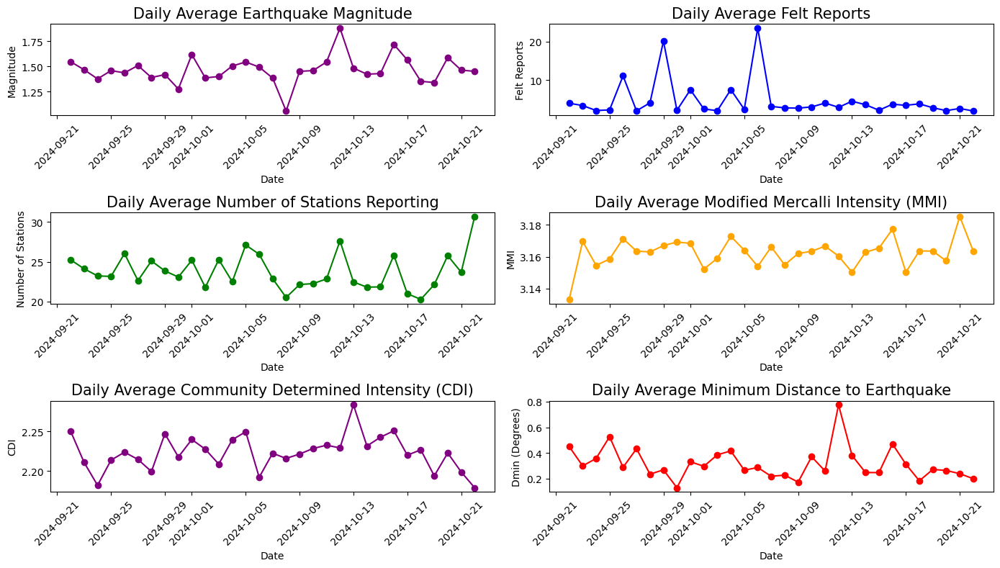

In [34]:
df['date'] = df['properties.time'].dt.date  
daily_avg = df.groupby('date').agg({
    'properties.mag': 'mean',
    'properties.felt': 'mean',
    'properties.nst': 'mean',
    'properties.mmi': 'mean',
    'properties.cdi': 'mean',
    'properties.dmin': 'mean',
    'properties.gap': 'mean'
}).reset_index()

plt.figure(figsize=(14, 8))

# Daily Average Magnitude
plt.subplot(3, 2, 1)
plt.plot(daily_avg['date'], daily_avg['properties.mag'], marker='o', linestyle='-', color='purple')
plt.title('Daily Average Earthquake Magnitude', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.xticks(rotation=45)

# Daily Average Felt Reports
plt.subplot(3, 2, 2)
plt.plot(daily_avg['date'], daily_avg['properties.felt'], marker='o', linestyle='-', color='blue')
plt.title('Daily Average Felt Reports', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Felt Reports')
plt.xticks(rotation=45)

# Daily Average Number of Stations
plt.subplot(3, 2, 3)
plt.plot(daily_avg['date'], daily_avg['properties.nst'], marker='o', linestyle='-', color='green')
plt.title('Daily Average Number of Stations Reporting', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Number of Stations')
plt.xticks(rotation=45)

# Daily Average MMI
plt.subplot(3, 2, 4)
plt.plot(daily_avg['date'], daily_avg['properties.mmi'], marker='o', linestyle='-', color='orange')
plt.title('Daily Average Modified Mercalli Intensity (MMI)', fontsize=15)
plt.xlabel('Date')
plt.ylabel('MMI')
plt.xticks(rotation=45)

# Daily Average CDI
plt.subplot(3, 2, 5)
plt.plot(daily_avg['date'], daily_avg['properties.cdi'], marker='o', linestyle='-', color='purple')
plt.title('Daily Average Community Determined Intensity (CDI)', fontsize=15)
plt.xlabel('Date')
plt.ylabel('CDI')
plt.xticks(rotation=45)

# Daily Average Minimum Distance to Earthquake (Dmin)
plt.subplot(3, 2, 6)
plt.plot(daily_avg['date'], daily_avg['properties.dmin'], marker='o', linestyle='-', color='red')
plt.title('Daily Average Minimum Distance to Earthquake', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Dmin (Degrees)')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### Filtered Data

Time series plots are created in a manner that aims to study data points that are collected at prespecified time intervals. We analyze the trend of each metric associated with earthquakes over the past 7 days and gain insight into trends, seasonal patterns, and anomalies in earthquake activity impacts.

Daily averages are computed for earthquake metrics by grouping data by date according to column properties.time. The metrics comprise the magnitude, felt reports, Modified Mercalli Intensity, and many more.
 Earthquake metrics in the past 7 days have some fluctuations. The average magnitude peaked around October 16, 2024, at nearly 1.75 and then declined to stabilize to about 1.4 for the end of the week. Felt reports were similar in pattern, reaching 4 on October 16 and dropping to 2 by October 19, then rising to the end of the week. The number of reporting stations did not change much and was roughly between 20-30 and certainly increased at the end of the week. The Modified Mercalli intensity was steady with just slight fluctuations between 3.16 and reached a high of 3.18 on October 20. The community determined intensity followed the same magnitude profile, dropping from 2.24 to 2.18 at the end of the week. The average minimum distance to the earthquake was low, spiking to 0.4 degrees on October 16 before leveling off around 0.2 degrees.

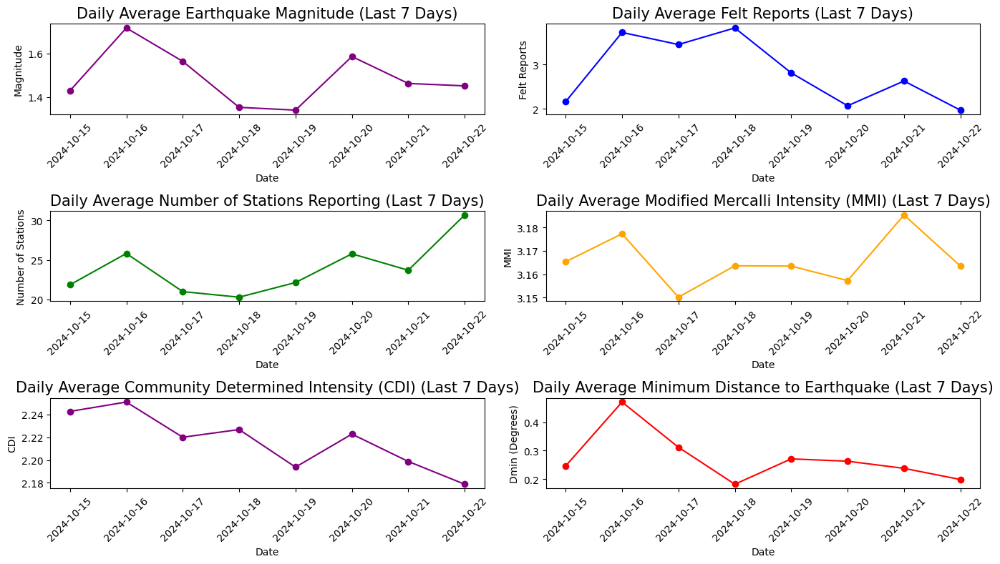

In [46]:
df['date'] = pd.to_datetime(df['date'])

last_7_days = df[(df['date'] >= pd.to_datetime('2024-10-15')) & (df['date'] <= pd.to_datetime('2024-10-22'))]

# Calculate daily averages
daily_avg_last_7 = last_7_days.groupby('date').agg({
    'properties.mag': 'mean',
    'properties.felt': 'mean',
    'properties.nst': 'mean',
    'properties.mmi': 'mean',
    'properties.cdi': 'mean',
    'properties.dmin': 'mean',
    'properties.gap': 'mean'
}).reset_index()

# Plotting
plt.figure(figsize=(14, 8))

# Daily Average Magnitude
plt.subplot(3, 2, 1)
plt.plot(daily_avg_last_7['date'], daily_avg_last_7['properties.mag'], marker='o', linestyle='-', color='purple')
plt.title('Daily Average Earthquake Magnitude (Last 7 Days)', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.xticks(rotation=45)

# Daily Average Felt Reports
plt.subplot(3, 2, 2)
plt.plot(daily_avg_last_7['date'], daily_avg_last_7['properties.felt'], marker='o', linestyle='-', color='blue')
plt.title('Daily Average Felt Reports (Last 7 Days)', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Felt Reports')
plt.xticks(rotation=45)

# Daily Average Number of Stations
plt.subplot(3, 2, 3)
plt.plot(daily_avg_last_7['date'], daily_avg_last_7['properties.nst'], marker='o', linestyle='-', color='green')
plt.title('Daily Average Number of Stations Reporting (Last 7 Days)', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Number of Stations')
plt.xticks(rotation=45)

# Daily Average MMI
plt.subplot(3, 2, 4)
plt.plot(daily_avg_last_7['date'], daily_avg_last_7['properties.mmi'], marker='o', linestyle='-', color='orange')
plt.title('Daily Average Modified Mercalli Intensity (MMI) (Last 7 Days)', fontsize=15)
plt.xlabel('Date')
plt.ylabel('MMI')
plt.xticks(rotation=45)

# Daily Average CDI
plt.subplot(3, 2, 5)
plt.plot(daily_avg_last_7['date'], daily_avg_last_7['properties.cdi'], marker='o', linestyle='-', color='purple')
plt.title('Daily Average Community Determined Intensity (CDI) (Last 7 Days)', fontsize=15)
plt.xlabel('Date')
plt.ylabel('CDI')
plt.xticks(rotation=45)

# Daily Average Minimum Distance to Earthquake (Dmin)
plt.subplot(3, 2, 6)
plt.plot(daily_avg_last_7['date'], daily_avg_last_7['properties.dmin'], marker='o', linestyle='-', color='red')
plt.title('Daily Average Minimum Distance to Earthquake (Last 7 Days)', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Dmin (Degrees)')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### Correlation plot

The correlation heatmap below presents the correlation between different properties regarding the earthquakes. Values of correlations lie between -1 to 1. A value of 1, a perfect positive correlation, means that if one variable changes, the other variable also changes in the same fashion. A value of -1 represents a perfect negative correlation, which means that an increase in one variable means a decrease in the other. This means that if a value is 0, then there's no correlation: it shows no apparent relationship between the variables being measured. And here are the values of these correlations that shed light on how different earthquake metrics, like magnitude, felt reports, and station reports, interact with each other.


The heatmap indicates a positive correlation between earthquake magnitude and number of reporting stations (0.51), minimum distance to the earthquake (0.51), and bigger earthquakes are captured by more stations over larger areas. Felt reports are poorly correlated with magnitude (0.06) but show a stronger association with Community Determined Intensity (CDI) and Modified Mercalli Intensity (MMI), suggesting that human perception of shaking is affected by something other than magnitude. The number of reporting stations also correlates negatively with the seismic gap (-0.37), which means fewer reporting stations when stations are farther apart. These relationships explain how detection and perception of earthquakes originate.


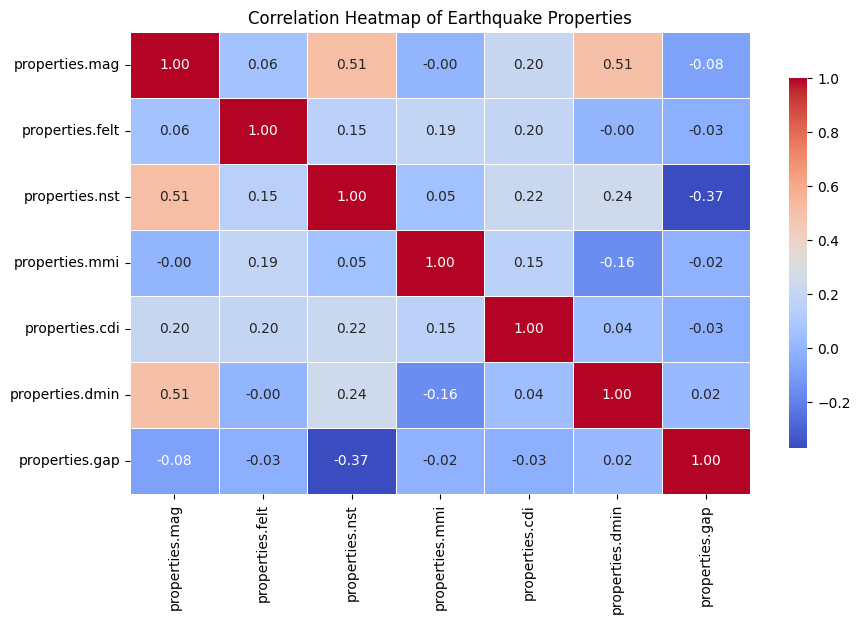

In [49]:
correlation_data = df[['properties.mag', 'properties.felt', 'properties.nst', 
                                  'properties.mmi', 'properties.cdi', 'properties.dmin', 
                                  'properties.gap']]

correlation_matrix = correlation_data.corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', 
            linewidths=.5, cbar_kws={"shrink": .8})
plt.title('Correlation Heatmap of Earthquake Properties')
plt.show()

## Folium Map plot

The Folium map gives a global view of earthquake events; distribution, intensity, and effects will become more evident from these events. It's achieved through an interactive interface.

To increase readability of the map, we use **marker clustering**. Grouping markers of nearby earthquakes reduces clutter; it becomes extremely easy for viewers to notice areas that show higher seismic activity.

The clusters are color-coded, ranging from green (for less frequent events) to orange or red (for more frequent events), thus it delivers a prompt visual cue regarding earthquake density in distinct regions.


The global earthquake map displays the data using marker clusters to group nearby events, thus reducing overcrowding. Each cluster indicates the number of earthquakes in a region and is colored from green (fewer events) to orange/red (more events). Individual earthquake markers are red for stronger earthquakes (magnitude ≥ 5) and blue for weaker ones. Upon clicking on a marker, extensive information about the event is given-including location, magnitude, felt reports, tsunami occurrence, and depth. The map was shown out at first, but the users could zoom into the map to gain more information on the detailed clusters or individual earthquake data.

In [39]:
df[['longitude', 'latitude', 'depth']] = pd.DataFrame(df['geometry.coordinates'].apply(lambda x: eval(x)).tolist())

mean_lat = df['latitude'].mean()
mean_long = df['longitude'].mean()
base_map = folium.Map(location=[mean_lat, mean_long], zoom_start=2)

marker_cluster = MarkerCluster().add_to(base_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=(
            f"Location: {row['properties.place']}<br>"
            f"Magnitude: {row['properties.mag']}<br>"
            f"Felt Reports: {row['properties.felt']}<br>"
            f"Tsunami: {'Yes' if row['properties.tsunami'] == 1 else 'No'}<br>"
            f"Depth: {row['depth']} km"
        ),
        icon=folium.Icon(color='red' if row['properties.mag'] >= 5 else 'blue', icon='info-sign')
    ).add_to(marker_cluster)

base_map

## Challenges Faced

Below are the challenges I encountered during the assignment:

* This was primarily because the dataset contains numerous null values in critical columns like magnitude (properties.mag) and felt reports (properties.felt), hence bringing inaccuracies in calculated averages and correlations. To correct this, I designed a cleaning scheme for data, which included median imputation for some fields and removal of critical null record.

* I also faced an issue of date formatting; here, the column is stored as a string that required special handling for time-based filtering. Thus, I converted date column to datetime format using pd.to_datetime, allowing me to perform accurate time-series analysis and visualization.

* The dataset also had outliers in properties.mag and properties.felt, which skewed the calculations. I used box plots and histograms to detect some outliers in the distribution of data and then capped and floored values using the 5th and 95th  percentiles to retain most of the data while reducing the influence of extreme values.

* Apart from that, the large dataset burdened computation significantly, especially in generating visualizations. For this purpose, I performed efficient pandas groupby operations for aggregation and analyze only the last seven days for easing the strain and focusing on recent trends.

* Interpretation of correlations among several attributes of earthquakes was tenuous and thus needed careful consideration. In order to present these intercorrelations, I produced a heatmap, wherein one can clearly see that earthquake magnitude actually correlates with increased reports of felt earthquakes, thereby making this somewhat complicated understanding clearer to grasp.


## Key Insights

The analysis outlined several key insights on earthquake activity. 

* The average magnitude was shown to have been increasing, suggesting the potential for clustering of seismic events, and this is an important feature in informed prediction of future activity and in associating preparedness measures. 

* The strong correlation between magnitude of earthquake and the number of reports suggests that larger earthquakes tend to impact broader populations, reinforcing the importance of response planning based on projected magnitudes. 

* The variation in the mean daily number of reporting stations reflected the fact that lower numbers of stations frequently appear with lower felt reports, which again probably indicates under-reporting at minor seismic activities. Again, this calls for strong data gathering. 

* Finally, the analysis indicated that shallower earthquakes were likely to be felt only by those near the epicenter, thus representing one of the first demonstrations of the importance of depth in the estimation of earthquake impacts and guiding further efforts in monitoring earthquakes.


## Suggestions 

There are several key improvements that can be made to enhance the future analyses.

* Improving data collection should first be of utmost concern since better data would increase and improve on more comprehensive data points, such as even more felt reports and local seismic data, thus making the predictions and emergency responses more reliable. 

* Interactive visualization tools, such as Plotly or Dash, will also enable the users to explore data at much deeper levels, zoom into a specific date range, or properties, and be much more interactive with the data. 

* Developing machine learning models for forecasting earthquakes based on historical trends will help predict a more suitable preparation and response strategy by utilizing features like magnitude, depth, and frequency of the past earthquakes. 

* Lastly, In earthquake-prone areas, education on felt reports and seismic impacts should boost awareness and readiness, particularly for larger-magnitude earthquakes.